In [75]:
import json
from pathlib import Path
import urllib
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay


In [43]:
ANNOTATIONS_PATH = Path("./data/laser_annotations.json")
PREDICTIONS_PATH = Path("./data/laser_predictions.json")

In [44]:
with open(ANNOTATIONS_PATH, "r") as f:
    annotations = json.load(f)

annotations

[{'id': 33564,
  'annotations': [{'id': 58,
    'completed_by': 4,
    'result': [{'original_width': 3987,
      'original_height': 3016,
      'image_rotation': 0,
      'value': {'x': 47.58695457488871,
       'y': 39.99424912201776,
       'width': 0.22547197916327916,
       'keypointlabels': ['Red Laser']},
      'id': 'E6WkooRAi_',
      'from_name': 'kp-1',
      'to_name': 'img-1',
      'type': 'keypointlabels',
      'origin': 'manual'}],
    'was_cancelled': False,
    'ground_truth': False,
    'created_at': '2024-10-24T15:12:58.018502Z',
    'updated_at': '2024-10-24T15:12:58.018514Z',
    'draft_created_at': '2024-10-24T15:12:57.018123Z',
    'lead_time': 15.71,
    'prediction': {},
    'result_count': 0,
    'unique_id': 'b0d60270-e8a6-4519-889d-b5782a0ecdeb',
    'import_id': None,
    'last_action': None,
    'task': 33564,
    'project': 10,
    'updated_by': 4,
    'parent_prediction': None,
    'parent_annotation': None,
    'last_created_by': None}],
  'drafts': [

In [45]:
with open(PREDICTIONS_PATH, "r") as f:
    predictions = json.load(f)

predictions


[{'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030249.jpg'},
  'predictions': []},
 {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030250.jpg'},
  'predictions': []},
 {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030251.jpg'},
  'predictions': []},
 {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030252.jpg'},
  'predictions': []},
 {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030253.jpg'},
  'predictions': []},
 {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_Co

In [46]:
completed_annotations = [a for a in annotations if a["annotations"] and len(a["annotations"][0]["result"]) <= 1]

completed_annotations

[{'id': 33564,
  'annotations': [{'id': 58,
    'completed_by': 4,
    'result': [{'original_width': 3987,
      'original_height': 3016,
      'image_rotation': 0,
      'value': {'x': 47.58695457488871,
       'y': 39.99424912201776,
       'width': 0.22547197916327916,
       'keypointlabels': ['Red Laser']},
      'id': 'E6WkooRAi_',
      'from_name': 'kp-1',
      'to_name': 'img-1',
      'type': 'keypointlabels',
      'origin': 'manual'}],
    'was_cancelled': False,
    'ground_truth': False,
    'created_at': '2024-10-24T15:12:58.018502Z',
    'updated_at': '2024-10-24T15:12:58.018514Z',
    'draft_created_at': '2024-10-24T15:12:57.018123Z',
    'lead_time': 15.71,
    'prediction': {},
    'result_count': 0,
    'unique_id': 'b0d60270-e8a6-4519-889d-b5782a0ecdeb',
    'import_id': None,
    'last_action': None,
    'task': 33564,
    'project': 10,
    'updated_by': 4,
    'parent_prediction': None,
    'parent_annotation': None,
    'last_created_by': None}],
  'drafts': [

In [47]:
annotations_by_url = {urllib.parse.unquote(a["data"]["img"]):a for a in completed_annotations}

annotations_by_url

{'/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023-09-07 REEF Data Dump/080123_FSL-01 Photos/P8010001.jpg': {'id': 33564,
  'annotations': [{'id': 58,
    'completed_by': 4,
    'result': [{'original_width': 3987,
      'original_height': 3016,
      'image_rotation': 0,
      'value': {'x': 47.58695457488871,
       'y': 39.99424912201776,
       'width': 0.22547197916327916,
       'keypointlabels': ['Red Laser']},
      'id': 'E6WkooRAi_',
      'from_name': 'kp-1',
      'to_name': 'img-1',
      'type': 'keypointlabels',
      'origin': 'manual'}],
    'was_cancelled': False,
    'ground_truth': False,
    'created_at': '2024-10-24T15:12:58.018502Z',
    'updated_at': '2024-10-24T15:12:58.018514Z',
    'draft_created_at': '2024-10-24T15:12:57.018123Z',
    'lead_time': 15.71,
    'prediction': {},
    'result_count': 0,
    'unique_id': 'b0d60270-e8a6-4519-889d-b5782a0ecdeb',
    'import_id': None,
    'last_action': None,
    'task': 33564,
    'project': 10,
   

In [48]:
len(annotations_by_url)

3255

In [49]:
predictions_by_url = {p["data"]["img"]:p for p in predictions if p["data"]["img"] in annotations_by_url}

predictions_by_url

{'/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030253.jpg': {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030253.jpg'},
  'predictions': []},
 '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030254.jpg': {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030254.jpg'},
  'predictions': []},
 '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030255.jpg': {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlackGrp_ConchLe_1430_080323/P8030255.jpg'},
  'predictions': []},
 '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023

In [50]:
len(predictions_by_url)

3255

In [51]:
false_negatives = [v for k, v in predictions_by_url.items() if not v["predictions"] and annotations_by_url[k]["annotations"][0]["result"]]

len(false_negatives)

1197

In [52]:
true_negative = [v for k, v in predictions_by_url.items() if not v["predictions"] and not annotations_by_url[k]["annotations"][0]["result"]]

len(true_negative)


428

In [53]:
false_positives = [v for k, v in predictions_by_url.items() if v["predictions"] and not annotations_by_url[k]["annotations"][0]["result"]]

len(false_positives)

152

In [54]:
true_positives = [v for k, v in predictions_by_url.items() if v["predictions"] and annotations_by_url[k]["annotations"][0]["result"]]

len(true_positives)


1478

In [55]:
annotations_with_values = {k:a for k, a in annotations_by_url.items() if a["annotations"][0]["result"] and predictions_by_url[k]["predictions"]}

annotations_with_values

{'/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023-09-07 REEF Data Dump/080123_FSL-01 Photos/P8010001.jpg': {'id': 33564,
  'annotations': [{'id': 58,
    'completed_by': 4,
    'result': [{'original_width': 3987,
      'original_height': 3016,
      'image_rotation': 0,
      'value': {'x': 47.58695457488871,
       'y': 39.99424912201776,
       'width': 0.22547197916327916,
       'keypointlabels': ['Red Laser']},
      'id': 'E6WkooRAi_',
      'from_name': 'kp-1',
      'to_name': 'img-1',
      'type': 'keypointlabels',
      'origin': 'manual'}],
    'was_cancelled': False,
    'ground_truth': False,
    'created_at': '2024-10-24T15:12:58.018502Z',
    'updated_at': '2024-10-24T15:12:58.018514Z',
    'draft_created_at': '2024-10-24T15:12:57.018123Z',
    'lead_time': 15.71,
    'prediction': {},
    'result_count': 0,
    'unique_id': 'b0d60270-e8a6-4519-889d-b5782a0ecdeb',
    'import_id': None,
    'last_action': None,
    'task': 33564,
    'project': 10,
   

In [56]:
predictions_with_values = {k:p for k, p in predictions_by_url.items() if p["predictions"] and k in annotations_with_values}

predictions_with_values

{'/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlueParrot01_MolHITW_0924_080323/P8030082.jpg': {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlueParrot01_MolHITW_0924_080323/P8030082.jpg'},
  'predictions': [{'model_version': '0.1.1.dev27+d3a360a',
    'result': [{'original_width': 3987,
      'original_height': 3016,
      'image_rotation': 0,
      'value': {'x': 48.97583814062369,
       'y': 46.35278514588859,
       'width': 0.25,
       'keypointlabels': ['Red Laser']},
      'id': 'ICXemSIlFw',
      'from_name': 'kp-1',
      'to_name': 'img-1',
      'type': 'keypointlabels'}]}]},
 '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlueParrot01_MolPeLe_1037_080323/P8030160.jpg': {'data': {'img': '/data/local-files/?d=fs_png_labeling_project_laser/REEF/data/2023.08.03.FishSense.FSL-01D/BlueParrot01_MolPeLe_1037_080323/P8030160.jpg'},

In [57]:
keys = [k for k in annotations_with_values.keys()]

x_true = np.array([annotations_with_values[k]["annotations"][0]["result"][0]["value"]["x"] for k in keys])
y_true = np.array([annotations_with_values[k]["annotations"][0]["result"][0]["value"]["y"] for k in keys])
x_pred = np.array([predictions_with_values[k]["predictions"][0]["result"][0]["value"]["x"] for k in keys])
y_pred = np.array([predictions_with_values[k]["predictions"][0]["result"][0]["value"]["y"] for k in keys])


In [58]:
arr_true = np.array([x_true, y_true])
arr_pred = np.array([x_pred, y_pred])

arr_true.shape, arr_pred.shape

((2, 1478), (2, 1478))

In [59]:
differences = arr_true - arr_pred

differences

array([[-0.01356731,  0.0363897 , -0.01498091, ..., -0.91272809,
        -0.94667233, -0.9780339 ],
       [ 0.03843687,  0.0882875 ,  0.02338311, ..., -2.26879651,
        -4.14103389, -5.33675825]])

In [60]:
euclidean_distances = np.linalg.norm(differences, axis=0)

euclidean_distances

array([0.04076107, 0.0954929 , 0.02777044, ..., 2.44550816, 4.24786419,
       5.42563719])

In [61]:
correct_count = (euclidean_distances < 2.0).sum()

correct_count


np.int64(1141)

In [62]:
precision = correct_count / (len(true_positives) + len(false_positives))

precision


np.float64(0.7)

In [63]:
recall = correct_count / (len(true_positives) + len(false_negatives))

recall


np.float64(0.42654205607476636)

In [64]:
MSE = np.sqrt(differences ** 2).mean()
MSE # shape (num_data_points)

np.float64(1.6908238037816452)

In [65]:
width = float(annotations[0]["annotations"][0]["result"][0]["original_width"])
height = float(annotations[0]["annotations"][0]["result"][0]["original_height"])

In [66]:
arr_true = np.array([x_true / 100.0 * width, y_true / 100.0 * height])
arr_pred = np.array([x_pred / 100.0 * width, y_pred / 100.0 * height])

arr_true.shape, arr_pred.shape

((2, 1478), (2, 1478))

In [67]:
differences = arr_true - arr_pred

differences

array([[  -0.54092867,    1.45085753,   -0.59728887, ...,  -36.39046889,
         -37.74382592,  -38.99421161],
       [   1.15925594,    2.66275111,    0.70523449, ...,  -68.42690284,
        -124.89358203, -160.95662876]])

In [68]:
euclidean_distances = np.linalg.norm(differences, axis=0)

euclidean_distances

array([  1.27924906,   3.03236393,   0.92418054, ...,  77.50165971,
       130.47223163, 165.61275579])

In [69]:
euclidean_distances.shape

(1478,)

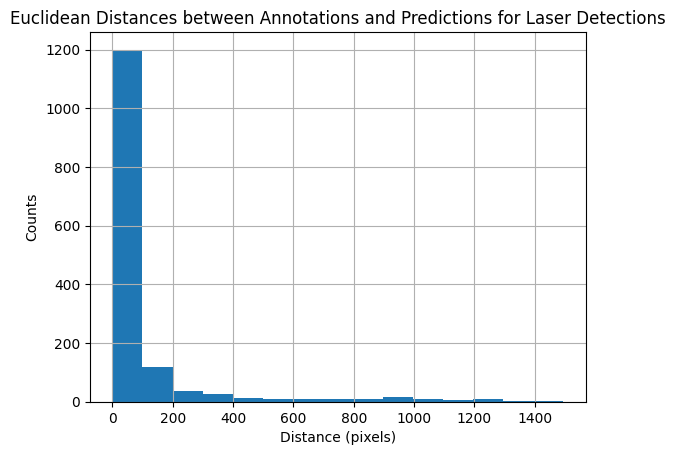

In [82]:
plt.hist(euclidean_distances, bins=15)
plt.grid(True)
plt.xlabel("Distance (pixels)")
plt.ylabel("Counts")
plt.title("Euclidean Distances between Annotations and Predictions for Laser Detections")
plt.show()

In [71]:
np.histogram(euclidean_distances)

(array([1271,   83,   35,   14,   18,   10,   22,   11,    9,    5]),
 array([   0.        ,  149.47744732,  298.95489463,  448.43234195,
         597.90978927,  747.38723659,  896.8646839 , 1046.34213122,
        1195.81957854, 1345.29702586, 1494.77447317]))

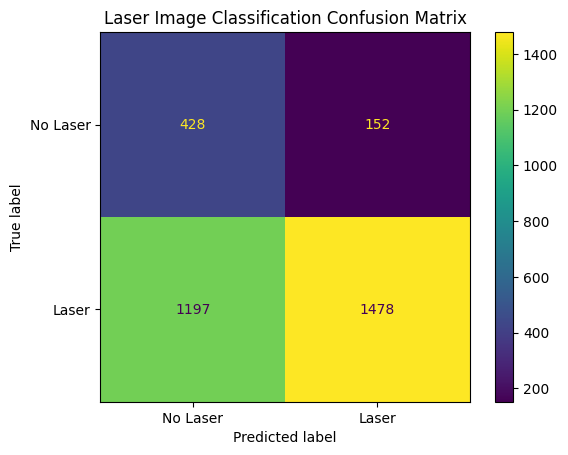

In [78]:
confusion_matrix = np.array([
    [len(true_negative), len(false_positives)],
    [len(false_negatives), len(true_positives)]
])

disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=["No Laser", "Laser"])
disp.plot()
plt.title("Laser Image Classification Confusion Matrix")
plt.show()